## SETUP

In [108]:
import os
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix
import time

In [3]:
%run feature_selection.ipynb

C:\Users\Joao Silva\Downloads
Missing values in Diagnosis at the Patient Level
0=Unknown
1=benign or non-malignant disease
2= malignant, primary lung cancer
3 = malignant metastatic
: 847
Missing values in Diagnosis Method
0 = unknown
1 = review of radiological images to show 2 years of stable nodule
2 = biopsy
3 = surgical resection
4 = progression or response: 847
Missing values in Primary tumor site for metastatic disease: 847
Missing values in Diagnosis Nodule 1: 865
Missing values in Diagnosis Method Nodule 1: 865
Missing values in Diagnosis Nodule 2: 954
Missing values in Diagnosis Method Nodule 2: 954
Missing values in Diagnosis Nodule 3: 966
Missing values in Diagnosis Method Nodule 3: 966
Missing values in Diagnosis Nodule 4: 966
Missing values in Diagnosis Method Nodule 4: 966
Missing values in Diagnosis Nodule 5: 966
Missing values in Diagnosis Method Nodule 5: 966
Missing values in Diagnosis at the Patient Level
0=Unknown
1=benign or non-malignant disease
2= malignant, prim

C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Selected Features: Index(['Nodule_id', 'Subtlety', 'Calcification', 'Margin',
       'original_shape_Elongation', 'original_shape_Maximum2DDiameterColumn',
       'original_shape_MinorAxisLength', 'original_shape_SurfaceArea',
       'original_glrlm_LongRunEmphasis',
       'original_glrlm_LongRunHighGrayLevelEmphasis',
       'original_glrlm_RunEntropy',
       'original_glrlm_ShortRunLowGrayLevelEmphasis',
       'original_gldm_DependenceNonUniformity',
       'original_gldm_DependenceVariance',
       'original_gldm_LargeDependenceEmphasis',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceEmphasis',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'Primary tumor site for metastatic disease'],
      dtype='object')


C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Selected Features: Index(['Nodule_id', 'Patient_id', 'Subtlety', 'Calcification', 'Sphericity',
       'Margin', 'Lobulation', 'Spiculation', 'original_shape_Elongation',
       'original_shape_Flatness', 'original_shape_LeastAxisLength',
       'original_shape_MajorAxisLength',
       'original_shape_Maximum2DDiameterColumn',
       'original_shape_Maximum2DDiameterRow',
       'original_shape_Maximum2DDiameterSlice',
       'original_shape_MinorAxisLength', 'original_shape_Sphericity',
       'original_shape_SurfaceArea', 'original_shape_SurfaceVolumeRatio',
       'original_shape_VoxelVolume', 'original_firstorder_Energy',
       'original_firstorder_TotalEnergy',
       'original_glrlm_GrayLevelNonUniformity',
       'original_glrlm_LongRunEmphasis',
       'original_glrlm_LongRunHighGrayLevelEmphasis',
       'original_glrlm_LongRunLowGrayLevelEmphasis',
       'original_glrlm_RunEntropy', 'original_glrlm_RunLengthNonUniformity',
       'original_glrlm_RunLengthNonUniformityNormal

C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Selected Features: Index(['Nodule_id', 'Subtlety', 'Calcification', 'Margin', 'Spiculation',
       'original_shape_Elongation', 'original_shape_Maximum2DDiameterColumn',
       'original_shape_MinorAxisLength', 'original_shape_Sphericity',
       'original_shape_SurfaceArea', 'original_shape_SurfaceVolumeRatio',
       'original_shape_VoxelVolume', 'original_glrlm_LongRunEmphasis',
       'original_glrlm_LongRunHighGrayLevelEmphasis',
       'original_glrlm_LongRunLowGrayLevelEmphasis',
       'original_glrlm_RunEntropy', 'original_glrlm_RunVariance',
       'original_glszm_ZonePercentage', 'original_gldm_DependenceEntropy',
       'original_gldm_DependenceNonUniformity',
       'original_gldm_DependenceVariance',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceEmphasis',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'Primary tumor site for metastatic dise

C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.576e+01, tolerance: 7.444e-03
  model = cd_fast.enet_coordinate_descent(
C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.576e+01, tolerance: 7.444e-03
  model = cd_fast.enet_coordinate_descent(
C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.57

0.4583333333333333


AttributeError: 'Flags' object has no attribute 'c_contiguous'

AttributeError: 'Flags' object has no attribute 'c_contiguous'

## Crucial Functions

In [90]:
def find_k_knn(X, y, kmax):
    k_values = [i for i in range (1,kmax+1)]
    accuracies = []
    for k in k_values:
        model = KNeighborsClassifier(k)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)
    print(accuracies)

    #Ploting the results of Cross Validation
    sns.lineplot(x = k_values, y = accuracies, marker = 'o')
    plt.xlabel("K Values")
    plt.ylabel("Accuracy Score")
    plt.title('Knn performance')

    best_index = np.argmax(accuracies)
    best_k = k_values[best_index]
    print(f'Best k = {best_k}')

In [93]:
def find_est_rf(X, y, numestimatorsmax, random_state):
    numest = [i for i in range(1, numestimatorsmax+1, 10)]
    accuracies = []
    for est in numest:
        model = RandomForestClassifier(est)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)
    print(accuracies)
    
    sns.lineplot(x = numest, y = accuracies, marker = 'o')
    plt.xlabel("Nr of estimators")
    plt.ylabel("Accuracy Score")
    plt.title('RandomForest performance')
    
    best_index = np.argmax(accuracies)
    best_est = numest[best_index]
    print(f'Best estimator = {best_est}')

In [149]:
def build_cm_knn(X, y, k):
    model = KNeighborsClassifier(k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)

    plt.figure()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.colorbar()
    plt.ylabel('Real')
    plt.xlabel('Predict')
    plt.show()

In [150]:
def build_heatmap_knn(X, y, k):
    model = KNeighborsClassifier(k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Reds")
    plt.xlabel('Predict')
    plt.ylabel('Real')
    plt.title('Confusion Matrix w/ values')
    plt.show()

In [151]:
def show_stats_knn(k):
    model = KNeighborsClassifier(k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    precision = precision_score(y_test, y_pred, average=None)
    recall = recall_score(y_test, y_pred, average=None)
    f1 = f1_score(y_test, y_pred, average=None)

    print("Precisão por classe:", precision)
    print("Recall por classe:", recall)
    print("F1-score por classe:", f1)

In [152]:
def time_stats_knn(k):
    start_time = time.time()
    model = KNeighborsClassifier(k)
    model.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time
    print("Tempo de Treinamento", training_time, "segundos")

In [176]:
def build_cm_rf(X, y, est):
    model = RandomForestClassifier(est)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)

    plt.figure()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.colorbar()
    plt.ylabel('Real')
    plt.xlabel('Predict')
    plt.show()

In [177]:
def build_heatmap_rf(X, y, est):
    model = RandomForestClassifier(est)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Reds")
    plt.xlabel('Predict')
    plt.ylabel('Real')
    plt.title('Confusion Matrix w/ values')
    plt.show()

In [179]:
def show_stats_rf(est):
    model = RandomForestClassifier(est)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    precision = precision_score(y_test, y_pred, average=None)
    recall = recall_score(y_test, y_pred, average=None)
    f1 = f1_score(y_test, y_pred, average=None)

    print("Precisão por classe:", precision)
    print("Recall por classe:", recall)
    print("F1-score por classe:", f1)

In [206]:
def time_stats_rf(est):
    start_time = time.time()
    model = RandomForestClassifier(est)
    model.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time
    print("Tempo de Treinamento", training_time, "segundos")

In [182]:
def build_pairplot(data, X):
    sns.pairplot(data, hue='Malignancy', vars=X)
    plt.title('Pairplot das Características por Classe')
    plt.show()

## Training with KNN 

### RFE Features with sd = 0.5

In [183]:
X = low_2d_sd[low_tree_02]
y = low_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

[0.6111111111111112, 0.5, 0.5555555555555556, 0.6666666666666666, 0.5833333333333334, 0.4722222222222222, 0.5833333333333334, 0.5833333333333334, 0.6111111111111112, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.4722222222222222, 0.4722222222222222, 0.5277777777777778, 0.5555555555555556, 0.5555555555555556]
Best k = 4


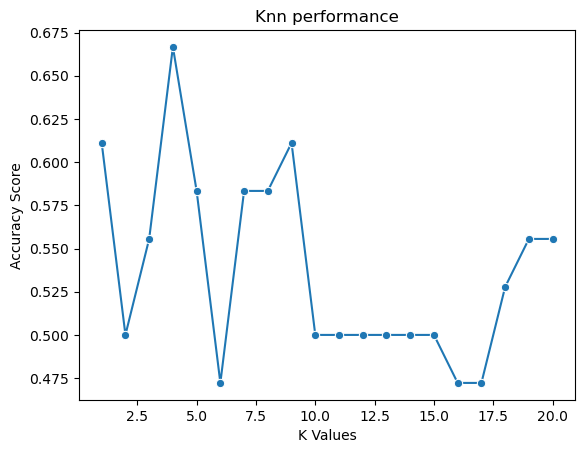

In [184]:
find_k_knn(X, y, 20)

Tempo de Treinamento 0.007002830505371094 segundos
Precisão por classe: [0.57142857 0.78947368 0.5        0.        ]
Recall por classe: [0.8        0.75       0.55555556 0.        ]
F1-score por classe: [0.66666667 0.76923077 0.52631579 0.        ]
Confusion Matrix:
 [[ 4  0  1  0]
 [ 2 15  3  0]
 [ 1  3  5  0]
 [ 0  1  1  0]]


C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


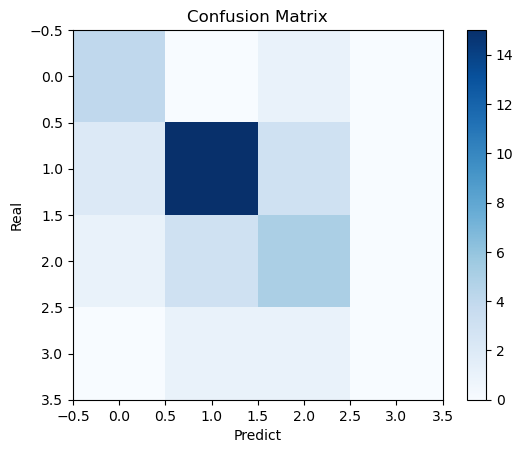

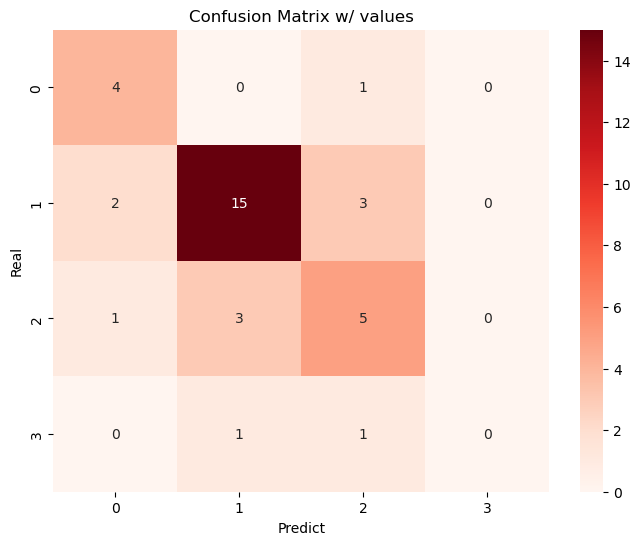

C:\Users\Joao Silva\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


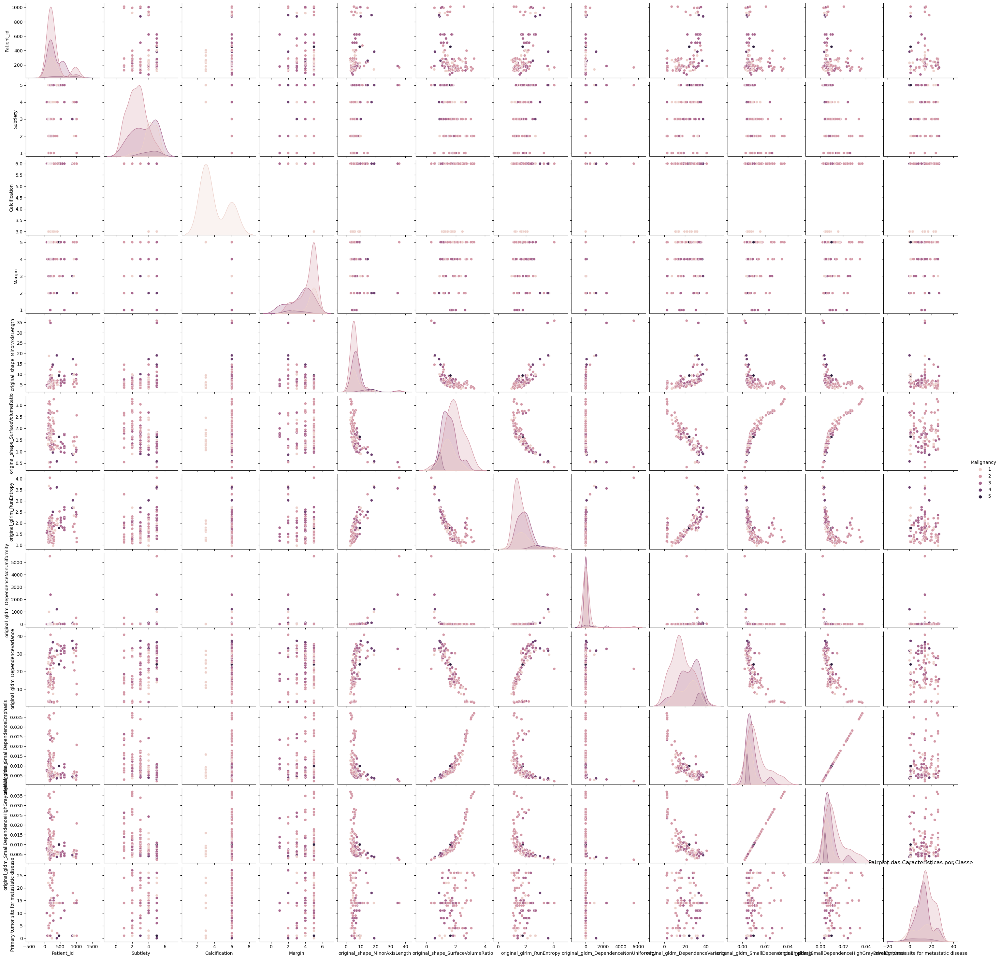

In [186]:
k = 4
time_stats_knn(k)
show_stats_knn(k)
build_cm_knn(X, y, k)
build_heatmap_knn(X, y, k)
build_pairplot(low_2d_sd, X)

### Tree Features with sd = 1.0 and threshold = 0.02

In [187]:
X = medium_2d_sd[medium_tree_02]
y = medium_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

[0.6111111111111112, 0.6388888888888888, 0.5555555555555556, 0.5833333333333334, 0.6111111111111112, 0.6666666666666666, 0.6388888888888888, 0.6111111111111112, 0.5277777777777778, 0.5277777777777778, 0.5555555555555556, 0.5555555555555556, 0.5833333333333334, 0.5277777777777778, 0.5555555555555556, 0.5555555555555556, 0.5555555555555556, 0.5833333333333334, 0.5555555555555556, 0.5833333333333334]
Best k = 6


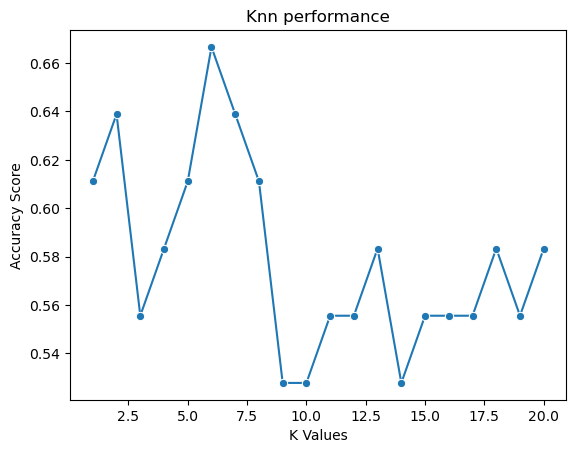

In [188]:
find_k_knn(X, y, 20)

Tempo de Treinamento 0.010309457778930664 segundos
Precisão por classe: [0.4        0.78947368 0.58333333 0.        ]
Recall por classe: [0.4        0.75       0.77777778 0.        ]
F1-score por classe: [0.4        0.76923077 0.66666667 0.        ]
Confusion Matrix:
 [[ 2  2  1  0]
 [ 2 15  3  0]
 [ 1  1  7  0]
 [ 0  1  1  0]]


C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


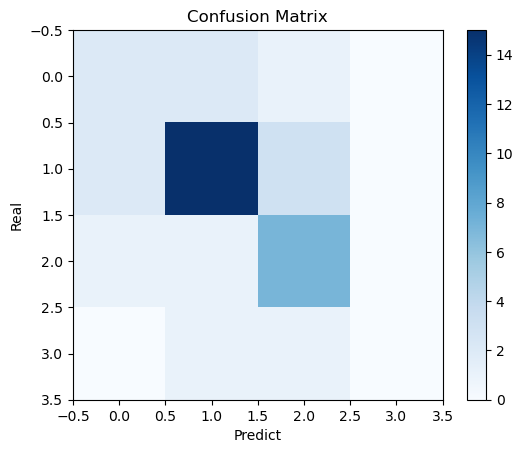

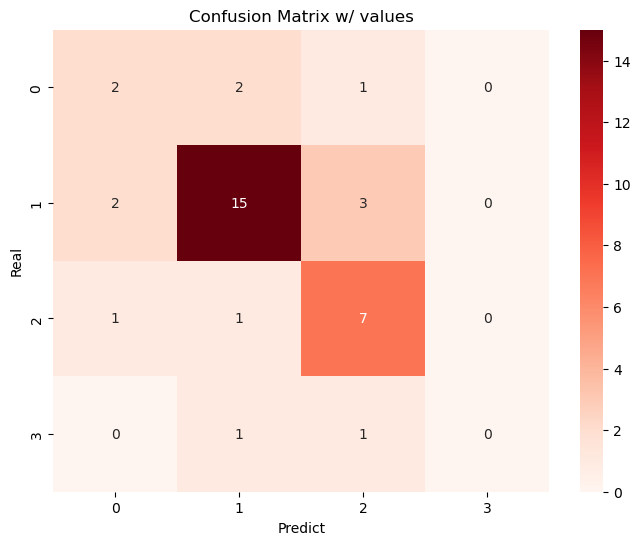

C:\Users\Joao Silva\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


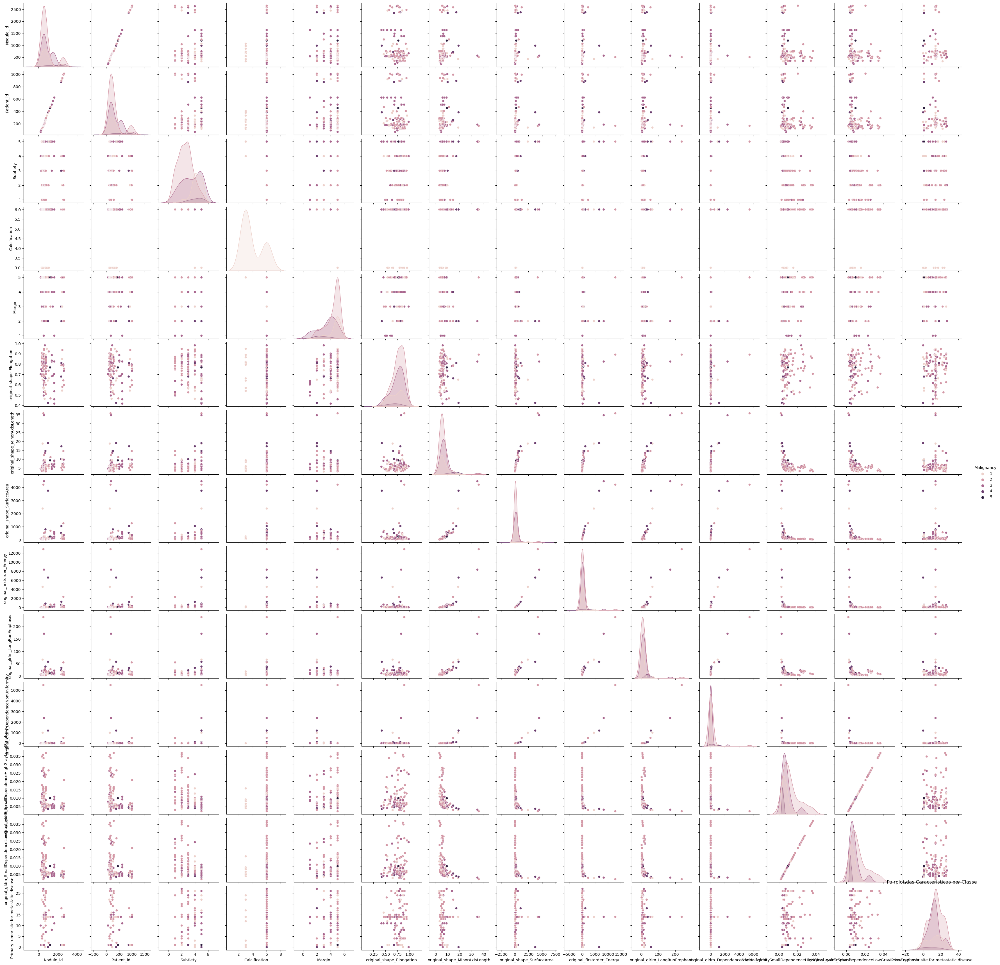

In [189]:
k = 6
time_stats_knn(k)
show_stats_knn(k)
build_cm_knn(X, y, k)
build_heatmap_knn(X, y, k)
build_pairplot(medium_2d_sd, X)

### Tree Features with sd = 1.5 and threshold = 0.02

In [190]:
X = high_2d_sd[high_tree_02]
y = high_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

[0.6111111111111112, 0.6388888888888888, 0.5555555555555556, 0.5833333333333334, 0.6111111111111112, 0.6666666666666666, 0.6388888888888888, 0.6111111111111112, 0.5277777777777778, 0.5277777777777778, 0.5555555555555556, 0.5555555555555556, 0.5833333333333334, 0.5277777777777778, 0.5555555555555556, 0.5555555555555556, 0.5555555555555556, 0.5833333333333334, 0.5555555555555556, 0.5833333333333334]
Best k = 6


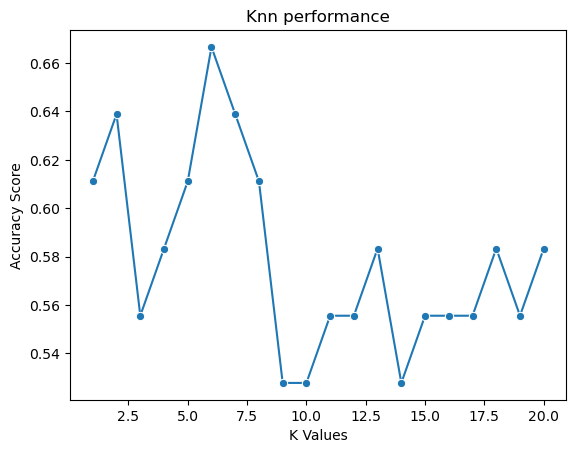

In [191]:
find_k_knn(X, y, 20)

Tempo de Treinamento 0.010277032852172852 segundos
Precisão por classe: [0.4        0.78947368 0.58333333 0.        ]
Recall por classe: [0.4        0.75       0.77777778 0.        ]
F1-score por classe: [0.4        0.76923077 0.66666667 0.        ]
Confusion Matrix:
 [[ 2  2  1  0]
 [ 2 15  3  0]
 [ 1  1  7  0]
 [ 0  1  1  0]]


C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


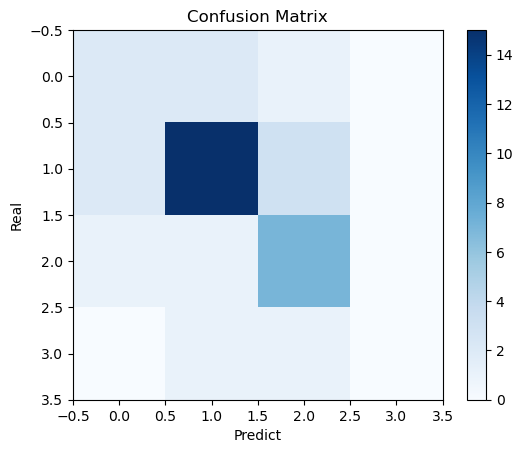

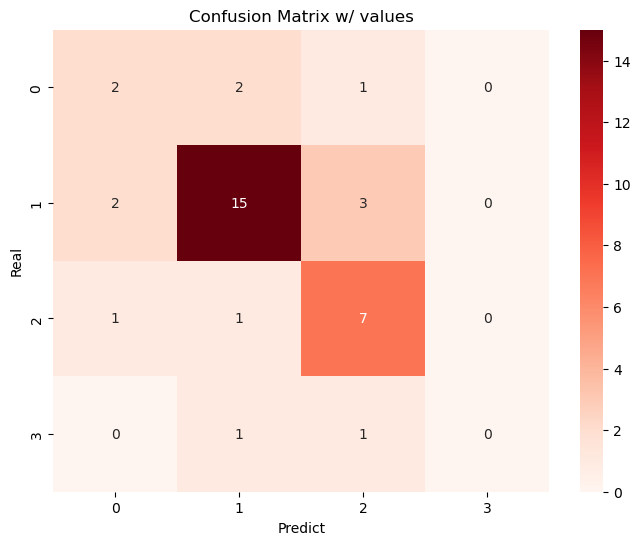

C:\Users\Joao Silva\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


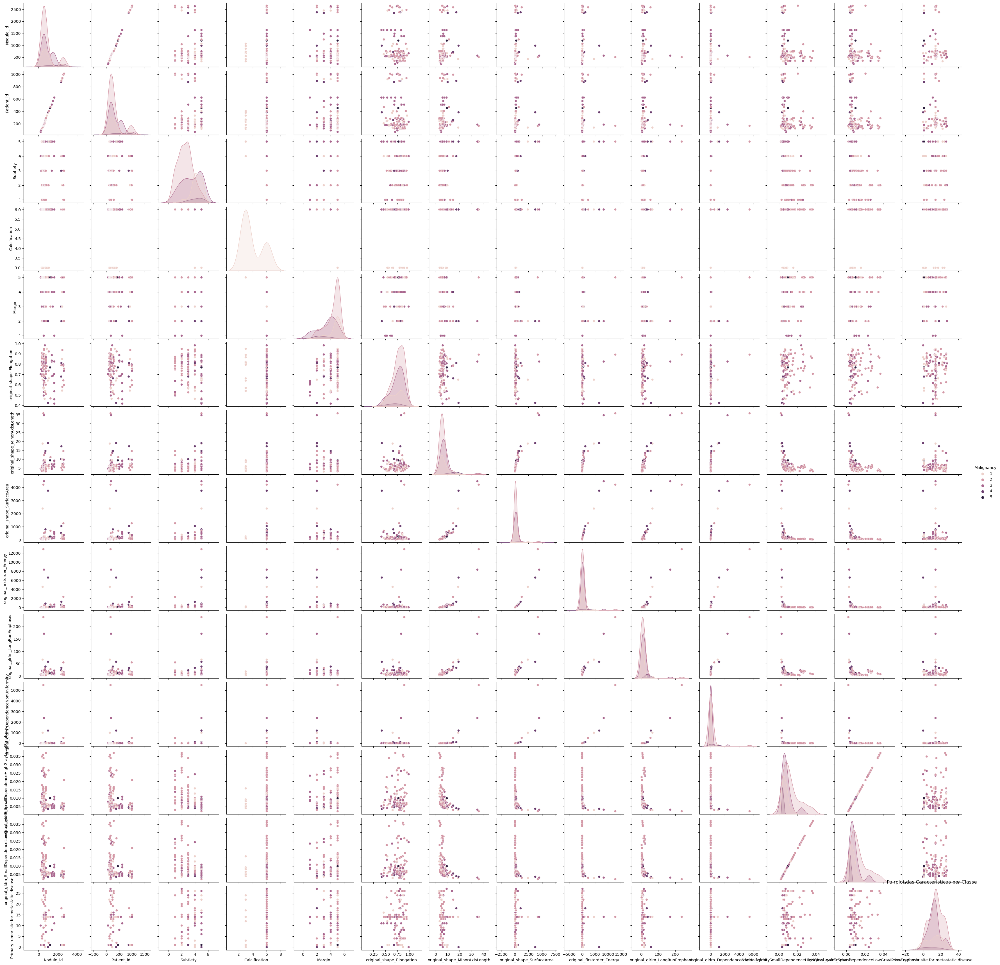

In [192]:
k = 6
time_stats_knn(k)
show_stats_knn(k)
build_cm_knn(X, y, k)
build_heatmap_knn(X, y, k)
build_pairplot(high_2d_sd, X)

## Training with RandomForest

### RFE Features with sd = 0.5

In [203]:
X = low_2d_sd[low_rfe]
y = low_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

[0.6388888888888888, 0.6111111111111112, 0.6666666666666666, 0.75, 0.6944444444444444, 0.6944444444444444, 0.7222222222222222, 0.8055555555555556, 0.6111111111111112, 0.7222222222222222, 0.6388888888888888, 0.6944444444444444, 0.6666666666666666, 0.6111111111111112, 0.6944444444444444, 0.6388888888888888, 0.6944444444444444, 0.6388888888888888, 0.6666666666666666, 0.7222222222222222]
Best estimator = 71


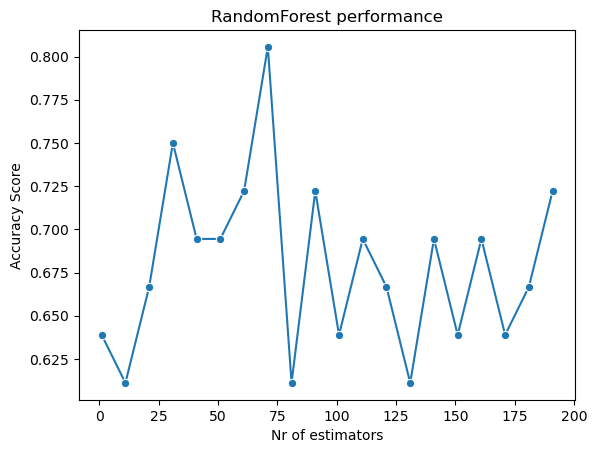

In [204]:
find_est_rf(X, y, 200, 42)

Tempo de Treinamento 0.07168126106262207 segundos
Precisão por classe: [0.8        0.88888889 0.46153846 0.        ]
Recall por classe: [0.8        0.8        0.66666667 0.        ]
F1-score por classe: [0.8        0.84210526 0.54545455 0.        ]
Confusion Matrix:
 [[ 4  0  1  0]
 [ 0 13  7  0]
 [ 0  3  6  0]
 [ 0  1  1  0]]


C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


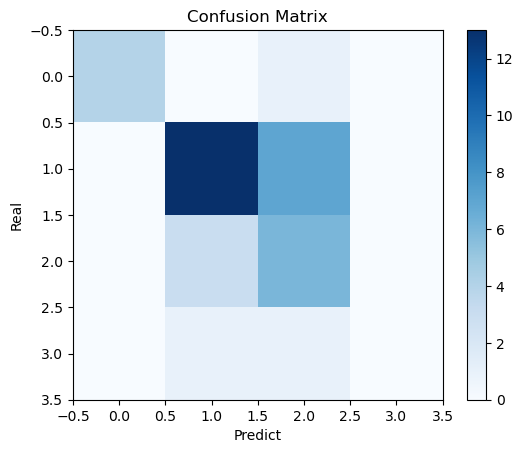

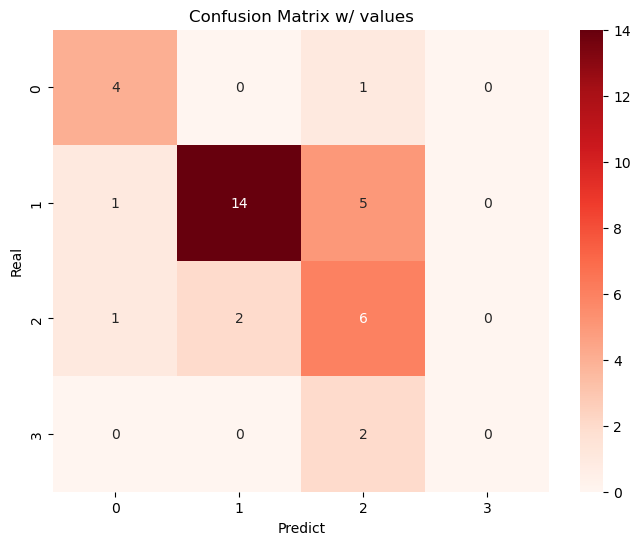

C:\Users\Joao Silva\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


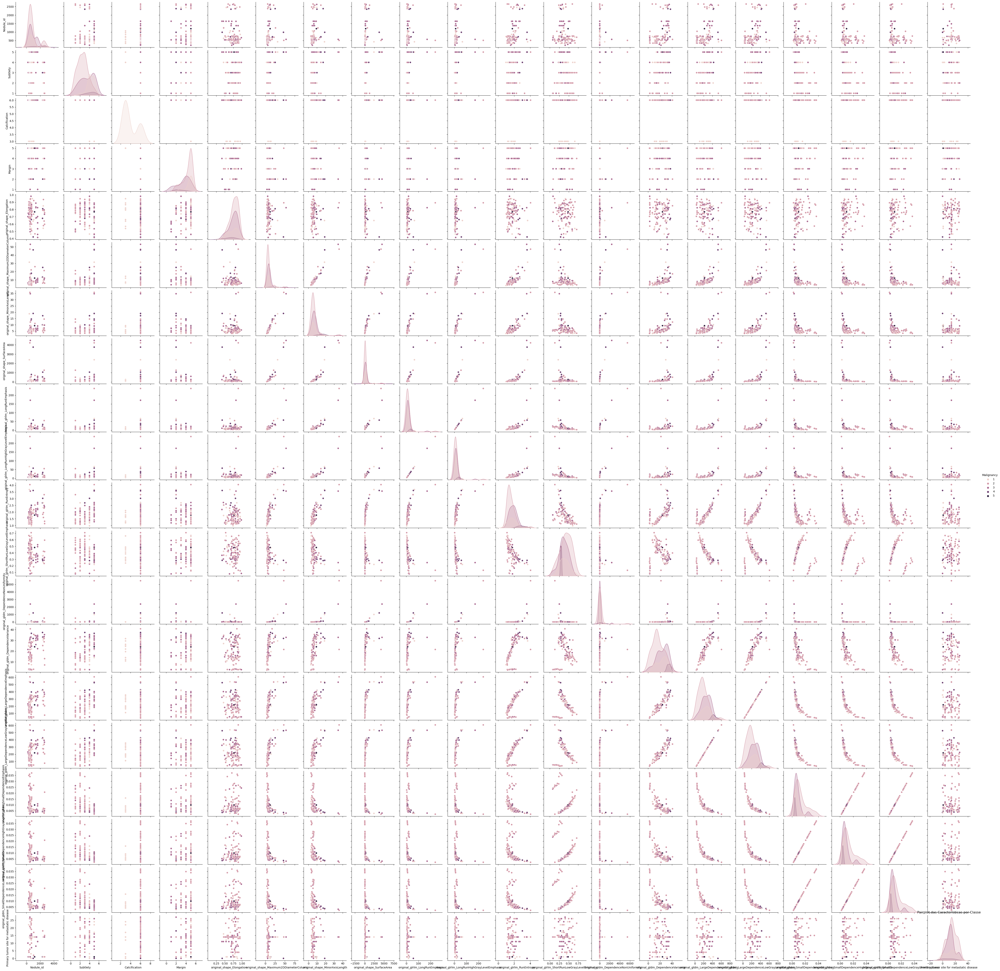

In [207]:
est = 71
time_stats_rf(est)
show_stats_rf(est)
build_cm_rf(X, y, est)
build_heatmap_rf(X, y, est)
build_pairplot(low_2d_sd, X)

### Tree Features with sd = 1.0 and threshold = 0.02

In [213]:
X = medium_2d_sd[medium_tree_02]
y = medium_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

[0.4444444444444444, 0.7222222222222222, 0.6666666666666666, 0.75, 0.6944444444444444, 0.7222222222222222, 0.6944444444444444, 0.6944444444444444, 0.7222222222222222, 0.75, 0.6944444444444444, 0.7222222222222222, 0.75, 0.7777777777777778, 0.6944444444444444, 0.6944444444444444, 0.7222222222222222, 0.75, 0.7222222222222222, 0.75]
Best estimator = 131


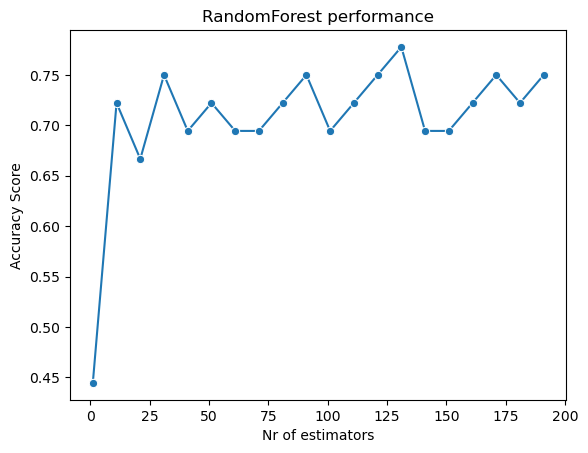

In [212]:
find_est_rf(X, y, 200, 42)

Tempo de Treinamento 0.10941624641418457 segundos
Precisão por classe: [0.8        0.82352941 0.5        0.        ]
Recall por classe: [0.8        0.7        0.77777778 0.        ]
F1-score por classe: [0.8        0.75675676 0.60869565 0.        ]


C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Confusion Matrix:
 [[ 4  0  1  0]
 [ 0 16  4  0]
 [ 1  1  7  0]
 [ 0  2  0  0]]


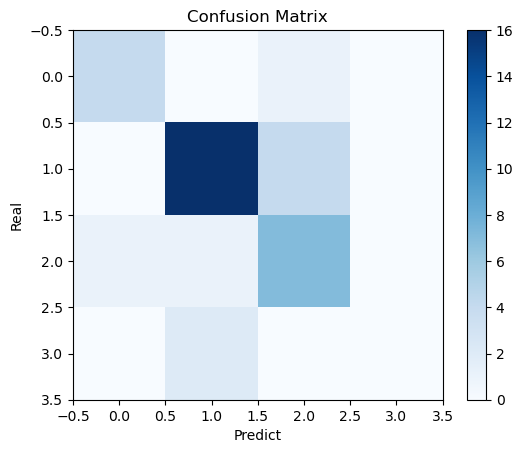

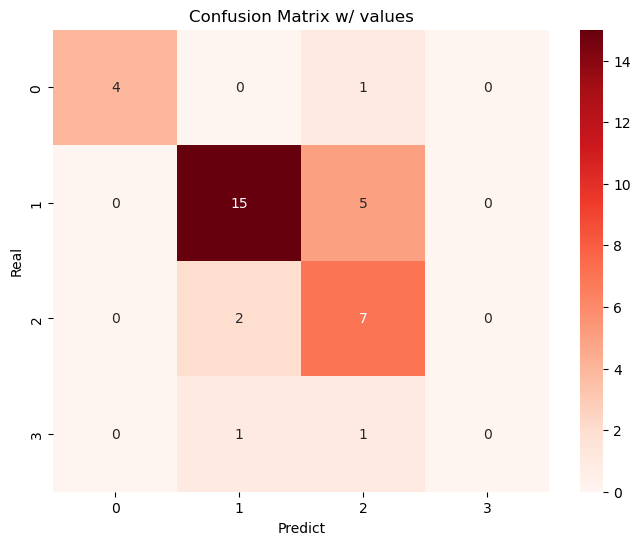

C:\Users\Joao Silva\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


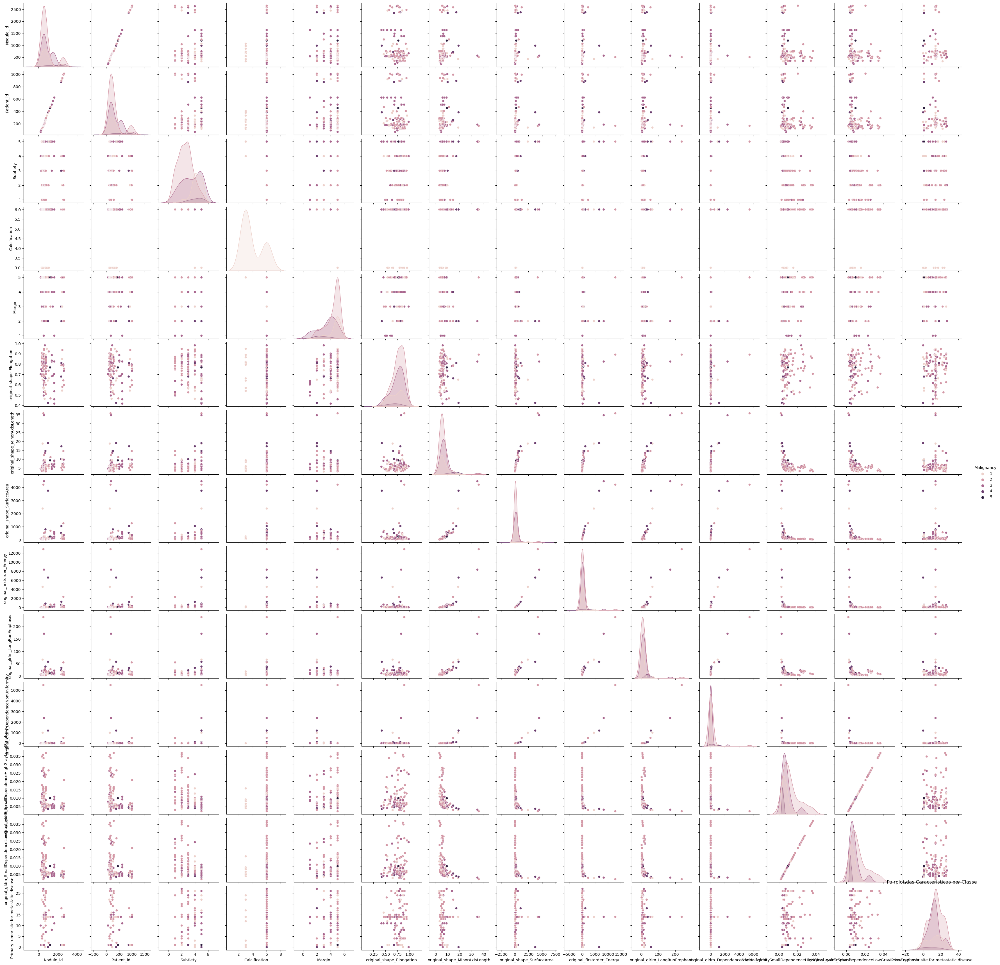

In [214]:
est = 131
time_stats_rf(est)
show_stats_rf(est)
build_cm_rf(X, y, est)
build_heatmap_rf(X, y, est)
build_pairplot(medium_2d_sd, X)

### Tree Features with sd = 1.5 and threshold = 0.02

In [216]:
X = high_2d_sd[high_tree_02]
y = high_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

[0.5833333333333334, 0.6111111111111112, 0.7777777777777778, 0.8055555555555556, 0.6666666666666666, 0.6666666666666666, 0.7222222222222222, 0.75, 0.6944444444444444, 0.7222222222222222, 0.6944444444444444, 0.7222222222222222, 0.7222222222222222, 0.75, 0.7222222222222222, 0.6944444444444444, 0.6944444444444444, 0.7222222222222222, 0.75, 0.7222222222222222]
Best estimator = 31


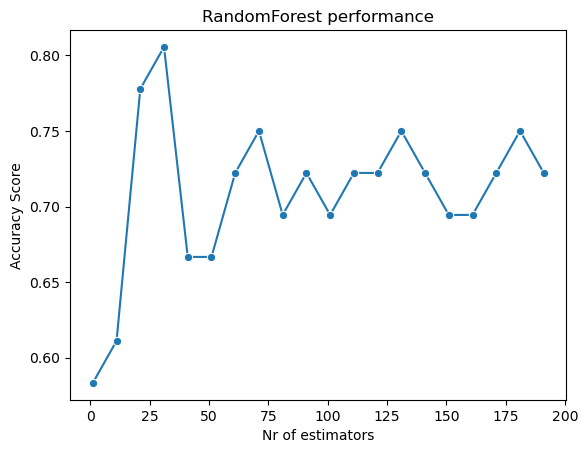

In [219]:
find_est_rf(X, y, 200, 42)

Tempo de Treinamento 0.03264617919921875 segundos
Precisão por classe: [0.66666667 0.9375     0.42857143 0.        ]
Recall por classe: [0.8        0.75       0.66666667 0.        ]
F1-score por classe: [0.72727273 0.83333333 0.52173913 0.        ]
Confusion Matrix:
 [[ 4  0  1  0]
 [ 0 14  6  0]
 [ 0  3  6  0]
 [ 0  1  1  0]]


C:\Users\Joao Silva\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


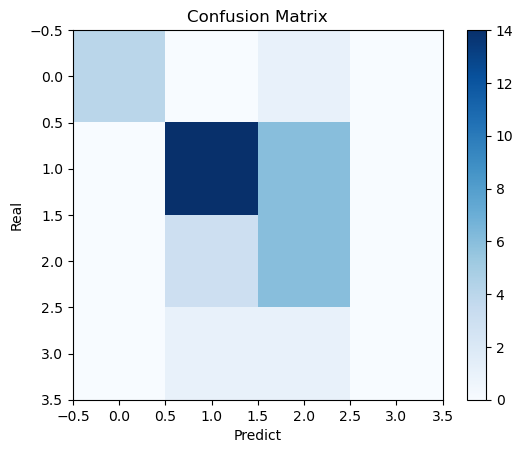

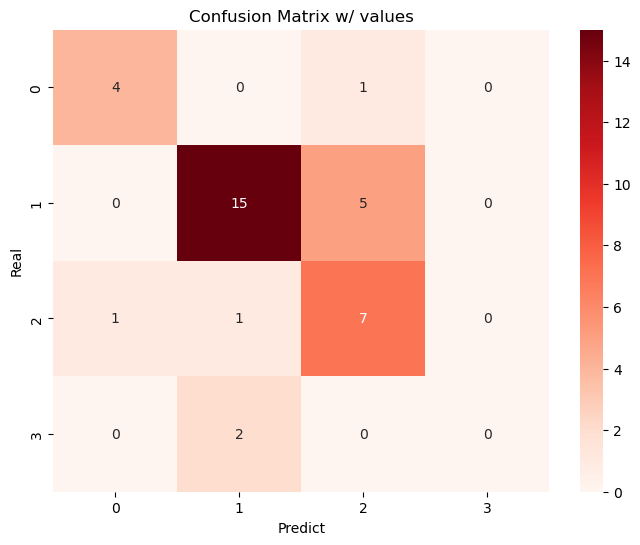

C:\Users\Joao Silva\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


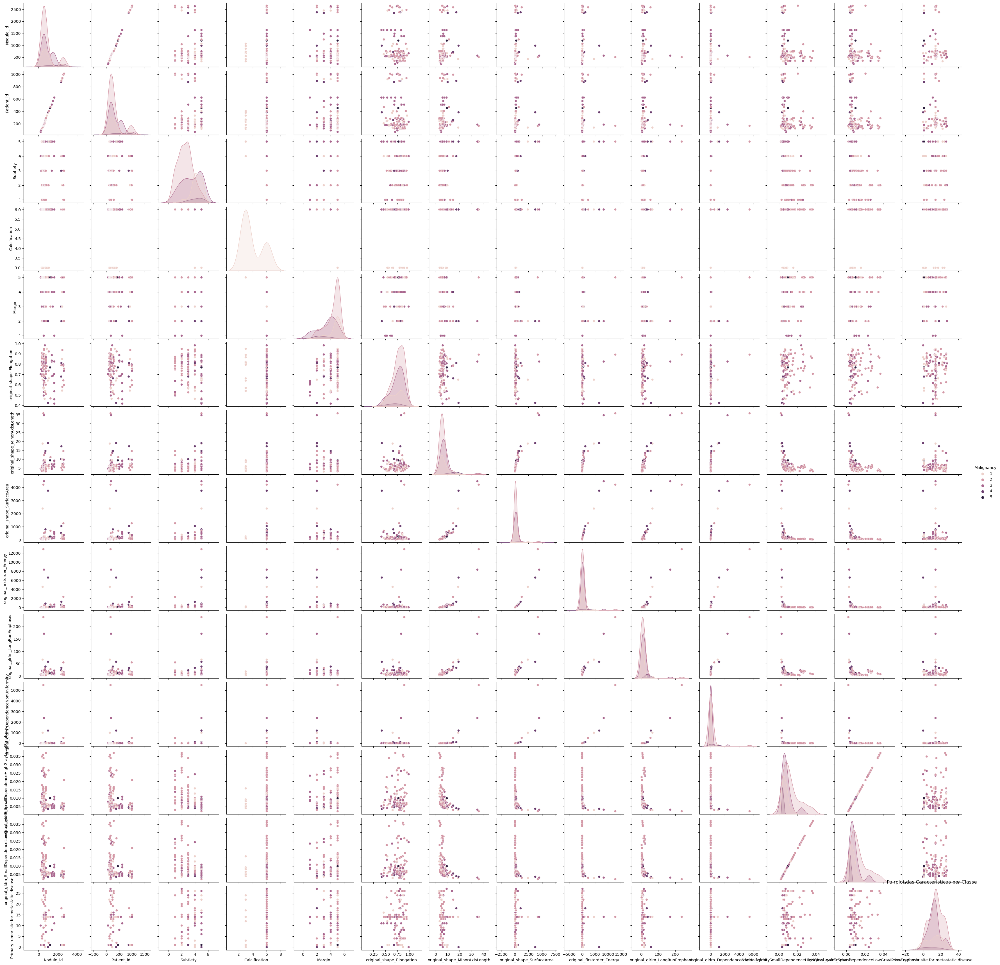

In [220]:
est = 31
time_stats_rf(est)
show_stats_rf(est)
build_cm_rf(X, y, est)
build_heatmap_rf(X, y, est)
build_pairplot(high_2d_sd, X)